In [1]:
!pip install plotly
!pip install geopandas

In [16]:
import pandas as pd
import geopandas as gpd
import plotly.graph_objects as go
from importlib import reload
import sys
from itertools import combinations
import json
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px

In [3]:
paths = ['../data','../utils']
for path in paths:
    sys.path.append(path)
    
# Data loader
from dataLoader import loadDataframe

In [4]:
path_to_directory = '../../data/cleanData/'
df_movies = loadDataframe('movies', path_to_directory)
df_characters = loadDataframe('characters', path_to_directory)

c:\Users\richa\OneDrive\Documents\EPFL\MA1\ada\ada-2024-project-teamcsx24\src\work\../data\dataLoader.py:10: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[columns_to_convert] = df[columns_to_convert].applymap(eval)


In [5]:
df_movies.head()

,wiki_id,freebase_id,original_title,release_date,revenue,runtime,languages,countries,genres,countries_freebase_id,languages_freebase_id,genres_freebase_id
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,[English Language],[United States of America],"[Thriller, Science Fiction, Horror, Adventure,...",[/m/09c7w0],[/m/02h40lc],"[/m/01jfsb, /m/06n90, /m/03npn, /m/03k9fj, /m/..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,[English Language],[United States of America],"[Mystery, Biographical film, Drama, Crime Drama]",[/m/09c7w0],[/m/02h40lc],"[/m/02n4kr, /m/03bxz7, /m/07s9rl0, /m/0hj3n01]"
2,28463795,/m/0crgdbh,Brun bitter,1988-01-01,NaN,83.0,[Norwegian Language],[Norway],"[Crime Fiction, Drama]",[/m/05b4w],[/m/05f_3],"[/m/0lsxr, /m/07s9rl0]"
3,9363483,/m/0285_cd,White Of The Eye,1987-01-01,NaN,110.0,[English Language],[United Kingdom],"[Thriller, Erotic thriller, Psychological thri...",[/m/07ssc],[/m/02h40lc],"[/m/01jfsb, /m/0glj9q, /m/09blyk]"
4,261236,/m/01mrr1,A Woman in Flames,1983-01-01,NaN,106.0,[German Language],[Germany],[Drama],[/m/0345h],[/m/04306rv],[/m/07s9rl0]


In [6]:
df_characters.head()

,wiki_id,freebase_id,release_date,character,birth_date,gender,height,ethnicity_freebase_id,name,age,character_actor_freebase_id,character_freebase_id,actor_freebase_id
0,975900,/m/03vyhn,2001-08-24,Akooshay,1958-08-26,F,1.620,NaN,Wanda De Jesus,42.0,/m/0bgchxw,/m/0bgcj3x,/m/03wcfv7
1,975900,/m/03vyhn,2001-08-24,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m,/m/0bgchn4,/m/0346l4
2,975900,/m/03vyhn,2001-08-24,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g,/m/0bgchn_,/m/01vw26l
3,975900,/m/03vyhn,2001-08-24,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6,/m/0bgchnq,/m/034hyc
4,975900,/m/03vyhn,2001-08-24,Bashira Kincaid,1977-09-25,F,1.650,NaN,Clea DuVall,23.0,/m/02vbb3r,/m/0bgchp9,/m/01y9xg


In [6]:
# Creating a dataframe country1 / country2 / link_intensity
sys.path.append('../scripts')
import populationScripts as ps      # Import the function that processes the data for this study
reload(ps)

c:\Users\richa\OneDrive\Documents\EPFL\MA1\ada\ada-2024-project-teamcsx24\src\work\../data\dataLoader.py:10: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[columns_to_convert] = df[columns_to_convert].applymap(eval)
c:\Users\richa\OneDrive\Documents\EPFL\MA1\ada\ada-2024-project-teamcsx24\src\work\../scripts\populationScripts.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  characters_modified['release_year'] = characters_modified['release_date'].apply(getReleaseYear)
c:\Users\richa\OneDrive\Documents\EPFL\MA1\ada\ada-2024-project-teamcsx24\src\work\../data\dataLoader.py:10: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[columns_to_convert] = df[columns_to_conver

<module 'populationScripts' from 'c:\\Users\\richa\\OneDrive\\Documents\\EPFL\\MA1\\ada\\ada-2024-project-teamcsx24\\src\\work\\../scripts\\populationScripts.py'>

In [8]:
# function that associates each actor with the countries in which they played using a groupby
ps.countries_for_actor.head()

actor_freebase_id
/m/010xjr    [['/m/03rt9'], ['/m/07ssc'], ['/m/09c7w0'], ['...
/m/0112yl    [['/m/03_3d'], ['/m/0b90_r'], ['/m/07ssc'], ['...
/m/011_3s                        [['/m/09c7w0'], ['/m/03_3d']]
/m/011_8                        [['/m/0d060g'], ['/m/09c7w0']]
/m/011vx3                        [['/m/09c7w0'], ['/m/059j2']]
Name: countries_freebase_id_x, dtype: object

In [9]:
#dataframe of the international actors (those who played in several countries)
international_actors_df = ps.createInternationalActorDf()
international_actors_df = international_actors_df.dropna(subset = 'release_date')
# creating a line with the release year
international_actors_df['release_year'] = international_actors_df['release_date'].apply(ps.getReleaseYear) 

international_actors_df.head()

C:\Users\richa\AppData\Local\Temp\ipykernel_10092\956652214.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  international_actors_df['release_year'] = international_actors_df['release_date'].apply(ps.getReleaseYear)


,wiki_id,freebase_id,release_date,character,birth_date,gender,height,ethnicity_freebase_id,name,age,character_actor_freebase_id,character_freebase_id,actor_freebase_id,countries_freebase_id_x,number_production_countries,countries_freebase_id_y,release_year
0,975900,/m/03vyhn,2001-08-24,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m,/m/0bgchn4,/m/0346l4,['/m/09c7w0'],1,2,2001
1,975900,/m/03vyhn,2001-08-24,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6,/m/0bgchnq,/m/034hyc,['/m/09c7w0'],1,2,2001
2,975900,/m/03vyhn,2001-08-24,Whitlock,1945-08-02,F,1.753,NaN,Joanna Cassidy,56.0,/m/02vd6kw,/m/0bgchmx,/m/06lj1m,['/m/09c7w0'],1,2,2001
3,975900,/m/03vyhn,2001-08-24,McSimms,1944-07-22,M,1.800,NaN,Peter Jason,57.0,/m/0bgchxd,/m/0bgchxh,/m/03d663h,['/m/09c7w0'],1,2,2001
4,975900,/m/03vyhn,2001-08-24,Benchley,1935-08-13,M,NaN,NaN,Doug McGrath,66.0,/m/0bgcj4p,/m/0bgcj4s,/m/02r5d3j,['/m/09c7w0'],1,2,2001


In [10]:
#creating a dataframe with all the links in the form country1, country2, actor

df_links = pd.DataFrame({
    'country1': [],
    'country2': [],
    'actor': []
})
for actor in international_actors_df['actor_freebase_id'].unique() :
    df_actor = ps.createLinksYear(actor)
    df_actor.columns = ('country1', 'country2', 'actor')
    df_links = pd.concat([df_links, df_actor])

df_links.head()

,country1,country2,actor
0,['/m/09c7w0'],['/m/0d060g'],/m/0346l4
0,['/m/09c7w0'],['/m/07ssc'],/m/034hyc
0,['/m/09c7w0'],['/m/07ssc'],/m/06lj1m
0,['/m/09c7w0'],['/m/07ssc'],/m/03d663h
0,['/m/09c7w0'],['/m/0d060g'],/m/02r5d3j


In [11]:
#apply a function that takes an actor and a country and gives the earliest date in which the actor played in the country
df_links['date1'] = df_links.apply(lambda row: ps.findEarliestDate(row['actor'], row['country1'], international_actors_df), axis=1)
df_links['date2'] = df_links.apply(lambda row: ps.findEarliestDate(row['actor'], row['country2'], international_actors_df), axis=1)
df_links.head()

,country1,country2,actor,date1,date2
0,['/m/09c7w0'],['/m/0d060g'],/m/0346l4,1995.0,2005.0
0,['/m/09c7w0'],['/m/07ssc'],/m/034hyc,2000.0,1998.0
0,['/m/09c7w0'],['/m/07ssc'],/m/06lj1m,1968.0,1987.0
0,['/m/09c7w0'],['/m/07ssc'],/m/03d663h,1981.0,2010.0
0,['/m/09c7w0'],['/m/0d060g'],/m/02r5d3j,1985.0,1970.0


In [12]:
# compute the date in which the link appears between the 2 countries
df_links['date'] = df_links.apply(lambda row: max(row['date1'], row['date2']), axis=1)
df_links.head()

,country1,country2,actor,date1,date2,date
0,['/m/09c7w0'],['/m/0d060g'],/m/0346l4,1995.0,2005.0,2005.0
0,['/m/09c7w0'],['/m/07ssc'],/m/034hyc,2000.0,1998.0,2000.0
0,['/m/09c7w0'],['/m/07ssc'],/m/06lj1m,1968.0,1987.0,1987.0
0,['/m/09c7w0'],['/m/07ssc'],/m/03d663h,1981.0,2010.0,2010.0
0,['/m/09c7w0'],['/m/0d060g'],/m/02r5d3j,1985.0,1970.0,1985.0


In [13]:
# adding the names of the countries using the dictionnary
with open('../../data/freebaseIdDictionnaries/countries', 'r') as file:
        countries_dict = json.load(file)
df_links['name1'] = df_links['country1'].apply(lambda x: countries_dict[x.strip("['']")])
df_links['name2'] = df_links['country2'].apply(lambda x: countries_dict[x.strip("['']")])

#computing the number of occurence of each pair for each year
df_links_grouped = df_links.groupby(['name1', 'name2', 'date'])
links_occurence = pd.DataFrame(df_links_grouped['country1'].count())
links_occurence = links_occurence.reset_index(names=['name1', 'name2', 'date'])
print(links_occurence)

           name1                     name2    date  country1
0        Algeria                    Israel  1977.0         1
1        Algeria                     Italy  1987.0         1
2      Argentina                   Belgium  1993.0         1
3      Argentina                   Bolivia  1999.0         1
4      Argentina                    Brazil  1962.0         1
...          ...                       ...     ...       ...
5595  Yugoslavia              West Germany  1969.0         2
5596  Yugoslavia              West Germany  1979.0         1
5597  Yugoslavia              West Germany  1983.0         1
5598    Zimbabwe            United Kingdom  2012.0         1
5599    Zimbabwe  United States of America  2011.0         1

[5600 rows x 4 columns]


In [14]:
links_occurence = links_occurence.dropna()
links_occurence = links_occurence.sort_values('date')#to have dates in chronological order
links_occurence['date'] = links_occurence['date'].astype(int)
links_occurence.head()

,name1,name2,date,country1
1383,Germany,Denmark,1910,1
4262,United States of America,Australia,1913,2
1349,Germany,Austria,1913,1
1591,Germany,West Germany,1916,1
3586,United Kingdom,Austria,1916,1


In [15]:
# plotting the map with a slider
import plotly.express as px
from shapely.geometry import Point

# charging geographical data 
world = gpd.read_file('../../data/map/ne_110m_admin_0_countries.shp')

# changing data into the right projection to compute the centroids
world_projected = world.to_crs("EPSG:3395")
world_projected["centroid"] = world_projected.geometry.centroid
world["centroid"] = world_projected["centroid"].to_crs(world.crs) # converting back the centroids into the right projection

# Linking each centroid with a country
centroids = world.set_index("NAME")["centroid"] 
links_occurence["coord1"] = links_occurence["name1"].map(centroids)
links_occurence["coord2"] = links_occurence["name2"].map(centroids)

#Fixing centroid of USA (without Alaska), Canada, Norway and France
links_occurence.loc[links_occurence['name1'] == 'United States of America', 'coord1'] = Point(-98.35, 39.50)
links_occurence.loc[links_occurence['name2'] == 'United States of America', 'coord2'] = Point(-98.35, 39.50)

links_occurence.loc[links_occurence['name1'] == 'Canada', 'coord1'] = Point(-105, 56.8)
links_occurence.loc[links_occurence['name2'] == 'Canada', 'coord2'] = Point(-105, 56.8)

links_occurence.loc[links_occurence['name1'] == 'Norway', 'coord1'] = Point(10, 62)
links_occurence.loc[links_occurence['name2'] == 'Norway', 'coord2'] = Point(10, 62)

links_occurence.loc[links_occurence['name1'] == 'France', 'coord1'] = Point(2.25, 46.32)
links_occurence.loc[links_occurence['name2'] == 'France', 'coord2'] = Point(2.25, 46.32)

# Creating the figure
fig = px.scatter_geo(
    world,  # GeoDataFrame
    locations="ISO_A3",  # countries id
    hover_name="NAME",  # names to print
    title="Actors who played in several countries",
    
)

# Adding the links from links_occurence df
traces = []
for year in links_occurence["date"].unique():
    df_year = links_occurence[links_occurence["date"] == year]
    df_year = df_year.dropna(subset=["coord1", "coord2"])

    trace = px.scatter_geo(
        world,  # Carte de base
        locations="ISO_A3",
        hover_name="NAME",
        title=f"Interactions between countries ({year})"
    )
    for _, row in df_year.iterrows():
        fig.add_scattergeo(
            lon=[row["coord1"].x, row["coord2"].x],
            lat=[row["coord1"].y, row["coord2"].y],
            mode="lines",
            line=dict(width=row["country1"] / 10, color="blue"),
            name=f"{row['name1']} ↔ {row['name2']} ({row['date']})",
            opacity=0.8,
        )

    traces.append(trace)

# Adding a slider
fig.update_layout(showlegend=False, 
sliders = [
    dict(
        active=0,
        currentvalue={"prefix": "Year: "},
        pad={"t": 50},
        steps=[
            dict(
                label=str(year),
                method="update",
                args=[{"visible": [i <= idx for i in range(len(traces))]}],
            )
            for idx, year in enumerate(links_occurence["date"].unique())
        ],
    )
],
    width=1000,  
    height=800,  
)

fig.show()



Interpretation : 

- If you look at the map in **1910**, only a few countries are linked together. It means that actors having an international career come from and go to a very limited number of countries. Most of them stay in countries that have the **same language**, like the *USA, Great Britain and Australia* or *Argentina and Spain*. Others will go to **colonies** of their home country, like *Great Britain and India*. Most of the involved countries are countries from the North, meaning rich and developed countries (and their colonies)

- **As time goes by**, you can observe that the number of countries involved in international careers increases -> More populations are involved in the process of globalisation. 
- You can also see that the diversity of links between countries increases : for an international career, the possibilities are much broader !

- By **2013**, almost all countries are involved in the process except for a big part of the African countries, some countries in the Middle East and central Asia. 


In [16]:
# plotting the ethnicity graphs using plotly
# Creating a dataset for the study
df_ethnicities = ps.createEthicitiesDf()

#translate the ethnicity-id into names using the dictionnary
df_ethnicities['ethnicity_name'] = df_ethnicities['ethnicity_freebase_id'].apply(lambda x: ps.getEthnicity(x))
df_ethnicities = df_ethnicities.dropna(subset='ethnicity_name')
df_ethnicities['ethnicity_name'] = df_ethnicities['ethnicity_name'].astype(str).apply(lambda x: x.strip("['']"))
df_ethnicities.head()

C:\Users\richa\AppData\Local\Temp\ipykernel_10092\3276512390.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\richa\AppData\Local\Temp\ipykernel_10092\3276512390.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,wiki_id,freebase_id,release_date,character,birth_date,gender,height,ethnicity_freebase_id,name,age,character_actor_freebase_id,character_freebase_id,actor_freebase_id,release_year,ethnicity_name
2,975900,/m/03vyhn,2001-08-24,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g,/m/0bgchn_,/m/01vw26l,2001,African Americans
5,975900,/m/03vyhn,2001-08-24,Commander Helena Braddock,1949-05-26,F,1.727,/m/0x67,Pam Grier,52.0,/m/02vdcfp,/m/0bgchnd,/m/0418ft,2001,African Americans
11,975900,/m/03vyhn,2001-08-24,Tres,1959-03-09,M,NaN,/m/064b9n,Rodney A. Grant,42.0,/m/0bgchrs,/m/0bgchrw,/m/03ydsb,2001,Omaha Tribe of Nebraska
27,3196793,/m/08yl5d,2000-02-16,NaN,1937-11-10,M,NaN,/m/0x67,Albert Hall,62.0,/m/0lr37dy,NaN,/m/01lntp,2000,African Americans
55,2314463,/m/0734w5,2006-01-01,NaN,1974-02-08,M,1.630,/m/041rx,Seth Green,31.0,/m/04htrcg,NaN,/m/0gz5hs,2006,Jewish people


Text(0.5, 1.0, 'Evolution of the number of ethnicities per movie')

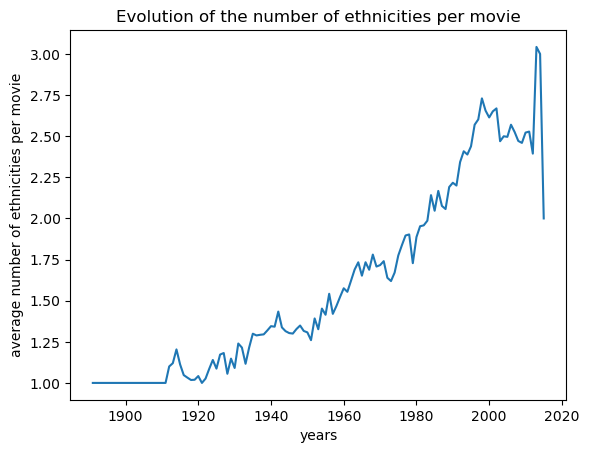

In [17]:
# plotting the average number of ethicities per movie per year
ethnicities_grouped = df_ethnicities.groupby(['release_year', 'freebase_id'])

number_ethnicities = pd.DataFrame(ethnicities_grouped['ethnicity_name'].nunique())
number_ethnicities.reset_index(inplace=True)

number_ethnicities_grouped = number_ethnicities.groupby(number_ethnicities.release_year)
average_ethnicity_per_year = number_ethnicities_grouped['ethnicity_name'].mean()

plt.plot(average_ethnicity_per_year.index, average_ethnicity_per_year.values)
plt.xlabel('years')
plt.ylabel('average number of ethnicities per movie')
plt.title('Evolution of the number of ethnicities per movie')

In [18]:
# plotting the repartition of each ethnicity in the dataframe
ethnicity_representation = df_ethnicities['ethnicity_name'].value_counts()[:100]
fig = px.bar(x= ethnicity_representation.index, y=ethnicity_representation.values)
fig.update_xaxes(showticklabels=False)
fig.update_layout(title_text='Repartition of the ethnicities in the dataframe',title_x=0.5, showlegend=False, legend_title=None)
fig.show()

In [19]:
#building a dicitonnary to associate each ethnicity with a part od the world thay originate from

ethnicity_to_category = {
    # Africa
    "Black Britons": "African Diaspora",
    "Black Canadians": "African Diaspora",
    "Black people": "African Diaspora",
    "Afro-Cuban": "African Diaspora",
    "Afro-Guyanese": "African Diaspora",
    "Xhosa people": "Africa",
    "Akan people": "Africa",
    "Yoruba people": "Africa",
    "Somali people": "Africa",
    "Berber": "North Africa",
    "Moroccans": "North Africa",
    "Kabyle people": "North Africa",
    "Egyptians": "North Africa",

    # Asia
    "Indians": "India",
    "Punjabis": "India",
    "Tamil": "India",
    "Bengali": "India",
    "Bihari people": "India",
    "Gujarati people": "India",
    "Marathi people": "India",
    "Kashmiri people": "India",
    "Pashtuns": "India",
    "Sindhis": "India",
    "Malayali": "India",
    "Ezhava": "India",
    "Brahmin": "India",
    "Kayastha": "India",
    "Telugu people": "India",
    "Nair": "India",
    "Punjabi diaspora": "India",
    "Tamil Brahmin": "India",
    "Bengali Hindus": "India",
    "Kanyakubja Brahmins": "India",
    "Rajput": "India",
    "Chettiar": "India",
    "Marwari people": "India",
    "Kashmiri Pandit": "India",
    "Mohyal": "India",
    "Gaud Saraswat Brahmin": "India",
    "Mangaloreans": "India",
    "Jaat": "India",
    "Agrawal": "India",
    "Kannada people": "India",
    "Tulu people": "India",
    "Mudaliar": "India",
    "Karnataka Brahmins": "India",
    "Chitrapur Saraswat Brahmin": "India",
    "Bengali Brahmins": "India",
    "Indian Americans": "India",
    "Indian Australians": "India",
    "Indian Canadian": "India",
    "Indian diaspora": "India",
    "Hindu": "India",
    "Dalit": "India",
    "Ezhavas": "India",
    "Sri Lankan Tamils": "India",
    "Sri Lankan Tamil diaspora": "India",
    "Telugu Brahmins": "India",
    'Bunt (RAJPUT)': "India",
    "British Indian": "India",

    # Other parts of Asia
    "Mizrahi Jews": "Jewish Diaspora",
    "Chinese Americans": "East Asia",
    "Hongkongers": "East Asia",
    "Japanese people": "East Asia",
    "Japanese people', 'Q31340083": "East Asia",
    "Korean Americans": "East Asia",
    "Koreans": "East Asia",
    "Taiwanese people": "East Asia",
    "Filipino Americans": "Southeast Asia",
    "Vietnamese Americans": "Southeast Asia",
    "Cambodian Americans": "Southeast Asia",
    'Armenians': "West Asia",

    # Europe
    "British": "Western Europe",
    "White British": "Western Europe",
    "Irish migration to Great Britain": "Western Europe",
    "English people": "Western Europe",
    "Irish people": "Western Europe",
    "Scottish people": "Western Europe",
    "Welsh people": "Western Europe",
    "French": "Western Europe",
    "Germans": "Western Europe",
    "Dutch": "Western Europe",
    "Italians": "Southern Europe",
    "Sicilians": "Southern Europe",
    "Greeks": "Southern Europe",
    "names of the Greeks": "Southern Europe",
    "Spanish people": "Southern Europe",
    "Spaniards": "Southern Europe",
    "Portuguese": "Southern Europe",
    "Swedes": "Northern Europe",
    "Norwegians": "Northern Europe",
    "Finns": "Northern Europe",
    "Danes": "Northern Europe",
    "Lithuanian Jews": "Eastern Europe",
    "Ashkenazi Jews": "Jewish Diaspora",
    "Sephardi Jews": "Jewish Diaspora",
    "Polish people": "Eastern Europe",
    "Russians": "Eastern Europe",
    "Ukrainians": "Eastern Europe",
    "Romanians": "Eastern Europe",
    "Hungarians": "Eastern Europe",
    "Czechs": "Eastern Europe",
    "Slovaks": "Eastern Europe",
    "Croats": "Eastern Europe",
    "Serbs": "Eastern Europe",
    "Bulgarians": "Eastern Europe",
    "Romani people": "Eastern Europe",

    # The Americas
    "Native Americans in the United States": "Indigenous Americas",
    "Cherokee": "Indigenous Americas",
    "Sioux": "Indigenous Americas",
    "Lumbee": "Indigenous Americas",
    "Indigenous peoples of the Americas": "Indigenous Americas",
    "Blackfoot Confederacy": "Indigenous Americas",
    "Mohawk": "Indigenous Americas",
    'Omaha Tribe of Nebraska': "Indigenous Americas",
    "Mexicans": "Latin America",
    "Puerto Ricans": "Latin America",
    "Cubans": "Latin America",
    "Brazilians": "Latin America",
    "Argentines": "Latin America",
    "Colombians": "Latin America",
    "Chileans": "Latin America",
    "Venezuelans": "Latin America",
    "Afro-Trinidadians": "African Diaspora",
    "Hispanic and Latino Americans": "Latin America",
    "White Americans": "United States",
    "Cajun": "United States",
    "European Americans": "United States",
    "Scottish Canadians": "Canada",
    "French Canadians": "Canada",
    'Lithuanian Americans': "Binational Americans",
    'German Americans': "Binational Americans",
    'Italian Americans': "Binational Americans",
    "Danish Americans": "Binational Americans",
    "French Americans": "Binational Americans",
    "Mexican Americans": "Binational Americans",
    "English Americans": "Binational Americans",
    'Nigerian Americans': "Binational Americans",
    'Greek Americans': "Binational Americans",
    "Syrian Americans": "Binational Americans", 
    "Iranian Americans": "Binational Americans",
    "Arab Americans": "Binational Americans",
    "Irish Americans": "Binational Americans",
    "Ukrainian Americans": "Binational Americans",
    "Romanian Americans": "Binational Americans",
    "Scottish Americans": "Binational Americans",
    "Swedish Americans": "Binational Americans",
    "Canadian Americans": "Binational Americans",
    "Dutch Americans": "Binational Americans",
    "Spanish Americans": "Binational Americans",
    "Russian Americans": "Binational Americans",
    "Cuban Americans": "Binational Americans",
    "Scandinavian Americans": "Binational Americans",
    "Finnish Americans": "Binational Americans",
    "Hungarian Americans": "Binational Americans",
    "Italian Canadians": "Binational Americans",
    "Asian Americans": "Binational Americans",
    "Guyanese Americans": "Binational Americans",
    "Japanese Americans": "Binational Americans",
    "Stateside Puerto Ricans": "Binational Americans",
    "Serbian Americans": "Binational Americans",
    "Dominican Americans": "Binational Americans",
    "Polish Americans": "Binational Americans",
    "Rusyn American": "Binational Americans",
    "Scotch-Irish Americans": "Binational Americans",
    "Australian Americans": "Binational Americans",
    "Czech Americans": "Binational Americans",
    "British Americans": "Binational Americans",
    "Slovak Americans": "Binational Americans",
    "Sicilian Americans": "Binational Americans",
    "Norwegian Americans": "Binational Americans",



    # Middle East
    "Arabs": "Middle East",
    "Palestinians in the United States": "Middle East",
    "Lebanese Americans": "Middle East",
    "Persians": "Middle East",
    "Parsi": "Middle East",
    'Arabs in Bulgaria': "Middle East",

    # Oceania
    "Aboriginal Australians":"Oceania",
    "Māori": "Oceania",
    "Samoans": "Oceania",
    "Pacific Islander Americans": "Oceania",
    "Anglo-Celtic Australians": "Oceania",
    "Kiwi": "Oceania",

    # Diasporic/Multiracial
    "Jewish people": "Jewish Diaspora",
    "American Jews": "Jewish Diaspora",
    "Multiracial Americans": "Multiracial",
    "Métis": "Multiracial",
    "Eurasian": "Multiracial",
}


# building a new file that contains the dictionnary
def saveDictionnary(dict, name):
    with open('../../data/freebaseIdDictionnaries/' + name, 'w') as fp:
        json.dump(dict, fp, indent=4)

saveDictionnary(ethnicity_to_category, 'ethnicity_to_category')

In [20]:
#associating each ethnicity with a broader region
def getWorldRegion(ethnicity):
    try :
        return ethnicity_to_category[ethnicity]
    except :
        return ethnicity

df_ethnicities['category'] = df_ethnicities['ethnicity_name'].apply(lambda x: getWorldRegion(x))

C:\Users\richa\AppData\Local\Temp\ipykernel_10092\2405791685.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [21]:
#There still are too many categories : we will also keep the 15 major ones
# list of the 15 most represented ethnicities
list_main_ethnicities = df_ethnicities['category'].value_counts()[:15].index

# selecting the most represented ethnicities
main_ethnicities = df_ethnicities[df_ethnicities['category'].isin(list_main_ethnicities)]

#Adding a row representing all the other ethnicities grouped together
other_df = df_ethnicities[~df_ethnicities['category'].isin(list_main_ethnicities)]
other_df['category'] = 'others'

main_ethnicities = pd.concat([main_ethnicities, other_df])

# Normalizing the data
main_ethnicities_grouped = main_ethnicities.groupby(['release_year', 'category']).size().reset_index(name='count')
main_ethnicities_grouped['proportion'] = main_ethnicities_grouped.groupby('release_year')['count'].transform(lambda x: x / x.sum())

C:\Users\richa\AppData\Local\Temp\ipykernel_10092\2561472161.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [53]:
#plotting the graph
custom_colors = px.colors.qualitative.Light24

fig_normalized = px.histogram(
    main_ethnicities_grouped,
    x='release_year',
    y='proportion',
    color='category',
    barmode='stack',
    title='Proportion of Ethnicities per Year',
    labels={'release_year': 'Year', 'proportion': 'Proportion'},
    nbins=220,
    color_discrete_sequence=custom_colors
)

fig_normalized.update_layout(
    xaxis=dict(title="Year", dtick=5),  # Set tick interval to 1 year
    yaxis=dict(title="Proportion"),
    template="plotly_white",
    legend_title_text="Ethnicity",
    width = 1000,
    height = 600,
)

fig_normalized.update_traces(xbins=dict( # bins used for histogram
        size=0.5
    ))
fig_normalized.show()

In [23]:
# plotting non-normalized version
fig_original = px.histogram(
    main_ethnicities_grouped,
    x='release_year',
    y='count',
    color='category',
    barmode='stack',
    title='Proportion of Ethnicities per Year',
    labels={'release_year': 'Year', 'count': 'Count'},
    nbins=220,
    color_discrete_sequence=custom_colors
)

fig_original.update_layout(
    xaxis=dict(title="Year", dtick=5),  # Set tick interval to 1 year
    yaxis=dict(title="Count"),
    template="plotly_white",
    legend_title_text="Ethnicity",
    width = 1000,
    height = 600,
)

fig_original.update_traces(xbins=dict( # bins used for histogram
        size=0.5
    ))
fig_original.show()

In [24]:
# figure with both normalized and original figure

#Getting traces from both figures
original_traces = fig_original.data
normalized_traces = fig_normalized.data

# Create a combined figure
fig = go.Figure()

# Add traces for both normalized and original data
for trace in normalized_traces:
    fig.add_trace(trace)
for trace in original_traces:
    fig.add_trace(trace)

# Hide original traces initially
for i in range(len(normalized_traces), len(fig.data)):
    fig.data[i].visible = False

# Add buttons
fig.update_layout(
    barmode="stack",
    width = 1000,
    height = 600,
    xaxis=dict(title="Year", dtick=5),
    updatemenus=[
        {
            "buttons": [
                {
                    "label": "Normalized",
                    "method": "update",
                    "args": [{"visible": [True] * len(normalized_traces) + [False] * len(original_traces)},
                             {"title": "Proportion of actors from each origin"}, {"yaxis": {"title": "Proportion of actors"}}]
                },
                {
                    "label": "Original",
                    "method": "update",
                    "args": [{"visible": [False] * len(normalized_traces) + [True] * len(original_traces)},
                             {"title": "Number of actors from each origin"}, {"yaxis": {"title": "Number of actors"}}]
                },
            ],
            "direction": "down",
            "showactive": True,
        }
    ]
)
fig.update_traces(xbins=dict( 
        size=0.5
    ))

# Show figure
fig.show()

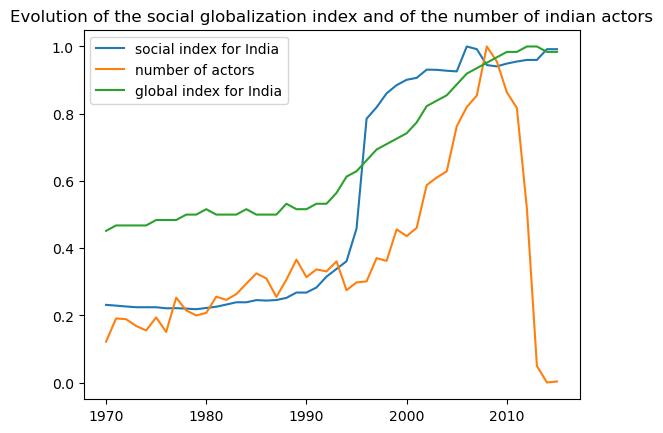

In [25]:
# comparing proportion and number of indian actors with KOF "social globalization" indicator
social_index_india = [7.235528,7.166563,7.08568,7.016714,7.016714,7.016714,6.918039,6.930832,6.887453,6.832157,6.946271,7.064507,7.264503,7.476416,7.476893,7.678243,7.634714,7.685738,7.88621,8.381138,8.378232,8.853642,9.859633,10.57654,11.2901,14.33727,24.53761,25.5972,26.89627,27.65962,28.15424,28.33372,29.09784,29.08258,28.99599,28.93487,31.25099,31.0016,29.52164,29.4011,29.66271,29.85311, 30, 30, 31, 31]
global_index_india = [28,29,29,29,29,30,30,30,31,31,32,31,31,31,32,31,31,31,33,32,32,33,33,35,38,39,41,43,44,45,46,48,51,52,53,55,57,58,59,60,61,61,62,62,61,61]
india_years = [i for i in range(1970, 2016)]
india_number = main_ethnicities_grouped[(main_ethnicities_grouped['category'] == "India") & (main_ethnicities_grouped['release_year'] >= 1970)]['count'].values
india_proportion = main_ethnicities_grouped[(main_ethnicities_grouped['category'] == "India") & (main_ethnicities_grouped['release_year'] >= 1970)]['proportion'].values

#normalizing the data to be able to compare
max_number = max(india_number)
india_number = list(map(lambda x: x/max_number, india_number))

max_proportion = max(india_proportion)
india_proportion = list(map(lambda x: x/max_proportion, india_proportion))

max_index = max(social_index_india)
social_index_india = list(map(lambda x: x/max_index, social_index_india))

max_global_index = max(global_index_india)
global_index_india = list(map(lambda x: x/max_global_index, global_index_india))

plt.plot(india_years, social_index_india, label='social index for India')
plt.plot(india_years, india_number, label='number of actors')
plt.plot(india_years, global_index_india, label='global index for India')
plt.legend()
plt.title('Evolution of the social globalization index and of the number of indian actors')
plt.show()

In [14]:
#creating a df with te KOF globalization index
kof_df = pd.read_csv("../../../KOFGI_2023.csv", delimiter=';')
kof_df.head()

,code,country,year,KOFGI,KOFGIdf,KOFGIdj,KOFEcGI,KOFEcGIdf,KOFEcGIdj,KOFTrGI,...,KOFIpGIdj,KOFInGI,KOFInGIdf,KOFInGIdj,KOFCuGI,KOFCuGIdf,KOFCuGIdj,KOFPoGI,KOFPoGIdf,KOFPoGIdj
0,ABW,Aruba,1970,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ABW,Aruba,1971,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ABW,Aruba,1972,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ABW,Aruba,1973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ABW,Aruba,1974,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
print(kof_df)

      code              country  year      KOFGI    KOFGIdf    KOFGIdj  \
0      ABW                Aruba  1970        NaN        NaN        NaN   
1      ABW                Aruba  1971        NaN        NaN        NaN   
2      ABW                Aruba  1972        NaN        NaN        NaN   
3      ABW                Aruba  1973        NaN        NaN        NaN   
4      ABW                Aruba  1974        NaN        NaN        NaN   
...    ...                  ...   ...        ...        ...        ...   
11175  UMC  Upper middle income  2017  61.267582  58.341171  64.301003   
11176  UMC  Upper middle income  2018  61.345528  58.479904  64.300278   
11177  UMC  Upper middle income  2019  61.562359  58.586834  64.622093   
11178  UMC  Upper middle income  2020  60.923813  57.453415  64.498062   
11179  UMC  Upper middle income  2021  61.386364  58.000744  64.879471   

         KOFEcGI  KOFEcGIdf  KOFEcGIdj    KOFTrGI  ...  KOFIpGIdj    KOFInGI  \
0            NaN        NaN    

In [15]:
#removing the lines that do not correspond to a country
kof_df = kof_df[:10556]
kof_df = kof_df.dropna(subset=['KOFGI', 'KOFSoGI', 'year'])#the features we will need
kof_df = kof_df.sort_values('year')
kof_df.head()

,code,country,year,KOFGI,KOFGIdf,KOFGIdj,KOFEcGI,KOFEcGIdf,KOFEcGIdj,KOFTrGI,...,KOFIpGIdj,KOFInGI,KOFInGIdf,KOFInGIdj,KOFCuGI,KOFCuGIdf,KOFCuGIdj,KOFPoGI,KOFPoGIdf,KOFPoGIdj
6604,MRT,Mauritania,1970,27.186024,29.442863,24.999575,33.695881,35.241371,31.887442,30.233255,...,33.500343,32.225029,52.444408,18.708572,8.004759,4.630645,10.124382,22.910034,22.485010,23.335060
4160,HTI,Haiti,1970,22.379978,23.714258,20.977736,19.471323,18.761435,20.302002,19.943115,...,13.992142,19.374022,25.310408,13.437638,16.850893,19.106304,14.595482,29.917631,31.310732,28.524534
2236,CYM,Cayman Islands,1970,37.927170,47.302826,26.366627,60.832619,79.347786,NaN,NaN,...,75.014000,NaN,NaN,58.083294,NaN,54.854565,NaN,2.371564,3.743128,1.000000
6760,MYS,Malaysia,1970,40.994896,47.596378,34.393414,47.968849,52.655167,43.282539,50.455193,...,43.996212,18.711515,15.752656,21.670376,38.697311,41.421120,35.973507,37.600670,49.183662,26.017679
4472,IRQ,Iraq,1970,30.922258,38.107182,23.241814,41.447861,53.049034,25.504503,39.849258,...,18.452021,17.629368,10.622619,24.636116,14.751761,25.721161,3.782361,33.976517,38.739338,29.213696


In [17]:
#plotting a map with the KOF index

# Creating the map
fig_global = px.choropleth(
    kof_df,
    locations="country",  # Colonne contenant les noms des pays
    locationmode="country names",  # Indique que les noms de pays sont utilisés
    color="KOFGI",  # Colonne pour la couleur
    animation_frame="year",
    color_continuous_scale="Viridis",  # Palette de couleurs
    title="Map of the globalization index",
    labels={"KOFGI": "KOF globalization index"}
)
fig_global.update_layout(
    width = 1000,
    height = 800
)

fig_global.write_html("Map of the KOF globalization index overtime.html")

In [31]:
#plotting a map with the KOF social globalization index

# Creating the map
fig_social = px.choropleth(
    kof_df,
    locations="country",  # Colonne contenant les noms des pays
    locationmode="country names",  # Indique que les noms de pays sont utilisés
    color="KOFSoGI",  # Colonne pour la couleur
    animation_frame="year",
    color_continuous_scale="Magma",  # Palette de couleurs
    title="Map of the social globalization index",
    labels={"KOFSoGI": "KOF social globalization index"}
)
fig_social.update_layout(
    width = 1000,
    height = 800
)
fig_social.show()

In [32]:
#map with the interpersonal globalization index
# Creating the map
fig_inter = px.choropleth(
    kof_df,
    locations="country",  # Colonne contenant les noms des pays
    locationmode="country names",  # Indique que les noms de pays sont utilisés
    color="KOFIpGI",  # Colonne pour la couleur
    animation_frame="year",
    color_continuous_scale="Plasma",  # Palette de couleurs
    title="Map of the interpersonal globalization index",
    labels={"KOFIpGI": "KOF interpersonal globalization index"}
)

fig_inter.update_layout(
    width = 1000,
    height = 800
)

fig_inter.show()

In [33]:
#map with the informational index
# Creating the map
fig_info = px.choropleth(
    kof_df,
    locations="country",  # Colonne contenant les noms des pays
    locationmode="country names",  # Indique que les noms de pays sont utilisés
    color="KOFInGI",  # Colonne pour la couleur
    animation_frame="year",
    color_continuous_scale="Inferno",  # Palette de couleurs
    title="Map of the informational globalization index",
    labels={"KOFInGI": "KOF informational globalization index"}
)

fig_info.update_layout(
    width = 1000,
    height = 800
)

fig_info.show()

In [34]:
#map with cultural index
fig_culture = px.choropleth(
    kof_df,
    locations="country",  # Colonne contenant les noms des pays
    locationmode="country names",  # Indique que les noms de pays sont utilisés
    color="KOFCuGI",  # Colonne pour la couleur
    animation_frame="year",
    color_continuous_scale="Inferno",  # Palette de couleurs
    title="Map of the cultural globalization index",
    labels={"KOFCuGI": "KOF cultural globalization index"}
)

fig_culture.update_layout(
    width = 1000,
    height = 800
)

fig_culture.show()

In [35]:
#creating an interactive figure
fig = go.Figure()

indices = ["KOFGI", "KOFSoGI", "KOFIpGI", "KOFInGI", "KOFCuGI"]
colors = ["Viridis", "Inferno", "Blues", "Reds", "Greens"]  
sliders = []  # List of sliders
button_visibility = []  # List to deal with the visibility of traces and sliders
buttons = []

# Creating traces and sliders
for idx, index_name in enumerate(indices):
    visibility = []  # Visibility of traces for this index
    steps = []  # Steps for the slider
    
    for year in kof_df["year"].unique():
        df_filtered = kof_df[kof_df["year"] == year]
        
        # Adding a trace for each year
        trace = go.Choropleth(
            locations=df_filtered["country"],
            locationmode="country names",
            z=df_filtered[index_name],
            colorscale=colors[idx],
            zmin=kof_df[index_name].min(),
            zmax= kof_df[index_name].max(),
            visible=(idx == 0 and year == kof_df["year"].min()),  # Visible if index == 0 and on first year
            name=f"{index_name} - {year}",
            colorbar_title=index_name if year == kof_df["year"].unique()[0] else None
        )
        fig.add_trace(trace)
        
        # Add a step for slider
        steps.append(dict(
            method="update",
            args=[{"visible": [trace == t for t in fig.data]},  # Displays only current trace
                  {"title": f"{index_name} ({year})"}],  # Updating title
            label=str(year)
        ))
        
        # Updating visibility
        visibility.append(trace.visible)
    
    # Creating a slider for this index
    sliders.append(dict(
        active=0,
        currentvalue={"prefix": "year: "},
        pad={"t": 50},
        steps=steps,
        visible=(idx == 0) 
    ))
    
    button_visibility.append(visibility)

    # Updating visibility for the button
    visibility = [False] * len(fig.data)
    for i in range(len(kof_df["year"].unique())):
        visibility[idx * len(kof_df["year"].unique()) + i] = True 
    
    # Ajouter le bouton
    buttons.append(dict(
        label=index_name,
        method="update",
        args=[
            {"visible": visibility},  # displaying the traces
            {"sliders": [sliders[idx]], "title": f"Map of {index_name}"}  # displaying the slider
        ]
    ))


# Adding sliders and buttons to plot
fig.update_layout(
    updatemenus=[dict(
        type="buttons",
        showactive=True,
        buttons=buttons
    )],
    sliders=sliders,
    title="Map of several indexes",
    geo=dict(showframe=False, showcoastlines=True),
    width = 1000, 
    height = 800
)

fig.show()


In [94]:
# dictionnary to associate each ethnicity with a country

with open("../../../further_refined_ethnicity_country_mapping.json", "r") as file:
    ethnicity_to_country = json.load(file)

In [97]:
#associating each ethnicity with a broader region
def getCountry(ethnicity):
    try :
        return  ethnicity_to_country[ethnicity]
        
    except :
        return ethnicity

df_ethnicities = ps.createEthicitiesDf()

#translate the ethnicity-id into names using the dictionnary
df_ethnicities['ethnicity_name'] = df_ethnicities['ethnicity_freebase_id'].apply(lambda x: ps.getEthnicity(x))
df_ethnicities = df_ethnicities.dropna(subset='ethnicity_name')
df_ethnicities['ethnicity_name'] = df_ethnicities['ethnicity_name'].astype(str).apply(lambda x: x.strip("['']"))

#associating each ethnicity with a country
df_ethnicities['actor_country'] = df_ethnicities['ethnicity_name'].apply(lambda x: getCountry(x))
df_ethnicities = df_ethnicities[df_ethnicities['actor_country'] != 'Unknown']


C:\Users\richa\AppData\Local\Temp\ipykernel_7292\2734677705.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\richa\AppData\Local\Temp\ipykernel_7292\2734677705.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\richa\AppData\Local\Temp\ipykernel_7292\2734677705.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [98]:
# plotting the repartition of each ethnicity in the dataframe
ethnicity_representation = df_ethnicities['actor_country'].value_counts()[:150]
fig = px.bar(x= ethnicity_representation.index, y=ethnicity_representation.values)
fig.update_xaxes(showticklabels=False)
fig.update_layout(title_text='Repartition of the countries in the dataframe',title_x=0.5, showlegend=False, legend_title=None)
fig.show()

In [99]:
#There still are too many categories : we will also keep the 15 major ones
# list of the 15 most represented ethnicities
list_main_ethnicities = df_ethnicities['actor_country'].value_counts()[:15].index

# selecting the most represented ethnicities
main_ethnicities = df_ethnicities[df_ethnicities['actor_country'].isin(list_main_ethnicities)]

#Adding a row representing all the other ethnicities grouped together
other_df = df_ethnicities[~df_ethnicities['actor_country'].isin(list_main_ethnicities)]
other_df['actor_country'] = 'Others'

main_ethnicities = pd.concat([main_ethnicities, other_df])

# Normalizing the data
main_ethnicities_grouped = main_ethnicities.groupby(['release_year', 'actor_country']).size().reset_index(name='count')
main_ethnicities_grouped['proportion'] = main_ethnicities_grouped.groupby('release_year')['count'].transform(lambda x: x / x.sum())

#selecting the data
main_ethnicities_grouped = main_ethnicities_grouped[main_ethnicities_grouped['release_year'] > 1908]

C:\Users\richa\AppData\Local\Temp\ipykernel_7292\767637935.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [100]:
#plotting the graph
custom_colors = px.colors.qualitative.Light24

fig_normalized = px.histogram(
    main_ethnicities_grouped,
    x='release_year',
    y='proportion',
    color='actor_country',
    barmode='stack',
    title='Proportion of Ethnicities per Year',
    labels={'release_year': 'Year', 'proportion': 'Proportion'},
    nbins=220,
    color_discrete_sequence=custom_colors
)

fig_normalized.update_layout(
    xaxis=dict(title="Year", dtick=5),  # Set tick interval to 1 year
    yaxis=dict(title="Proportion"),
    template="plotly_white",
    legend_title_text="Ethnicity",
    width = 1000,
    height = 600,
)

fig_normalized.update_traces(xbins=dict( # bins used for histogram
        size=0.5
    ))

In [101]:
# plotting non-normalized version
fig_original = px.histogram(
    main_ethnicities_grouped,
    x='release_year',
    y='count',
    color='actor_country',
    barmode='stack',
    title='Proportion of Ethnicities per Year',
    labels={'release_year': 'Year', 'count': 'Count'},
    nbins=220,
    color_discrete_sequence=custom_colors
)

fig_original.update_layout(
    xaxis=dict(title="Year", dtick=5),  # Set tick interval to 1 year
    yaxis=dict(title="Count"),
    template="plotly_white",
    legend_title_text="Ethnicity",
    width = 1000,
    height = 600,
)

fig_original.update_traces(xbins=dict( # bins used for histogram
        size=0.5
    ))

In [102]:
# figure with both normalized and original figure

#Getting traces from both figures
original_traces = fig_original.data
normalized_traces = fig_normalized.data

# Create a combined figure
fig = go.Figure()

# Add traces for both normalized and original data
for trace in normalized_traces:
    fig.add_trace(trace)
for trace in original_traces:
    fig.add_trace(trace)

# Hide original traces initially
for i in range(len(normalized_traces), len(fig.data)):
    fig.data[i].visible = False

# Add buttons
fig.update_layout(
    barmode="stack",
    width = 1000,
    height = 600,
    xaxis=dict(title="Year", dtick=5),
    updatemenus=[
        {
            "buttons": [
                {
                    "label": "Normalized",
                    "method": "update",
                    "args": [{"visible": [True] * len(normalized_traces) + [False] * len(original_traces)},
                             {"title": "Proportion of actors from each country"}, {"yaxis": {"title": "Proportion of actors"}}]
                },
                {
                    "label": "Original",
                    "method": "update",
                    "args": [{"visible": [False] * len(normalized_traces) + [True] * len(original_traces)},
                             {"title": "Number of actors from each country"}, {"yaxis": {"title": "Number of actors"}}]
                },
            ],
            "direction": "down",
            "showactive": True,
        }
    ]
)
fig.update_traces(xbins=dict( 
        size=0.5
    ))

fig.show()

In [110]:
#grouping the df by year and by country to compare it with the KOF index

df_ethnicities_kof = df_ethnicities[(df_ethnicities['release_year'] >= 1970) & (df_ethnicities['release_year'] <= 2010)]
df_ethnicities_grouped = df_ethnicities_kof.groupby(['release_year', 'actor_country']).size().reset_index(name='count')
df_ethnicities_grouped['proportion'] = df_ethnicities_grouped.groupby('release_year')['count'].transform(lambda x: x / x.sum())
df_ethnicities_grouped['log'] = df_ethnicities_grouped['count'].apply(np.log)
df_ethnicities_grouped.reset_index(inplace=True)
print(df_ethnicities_grouped)

      index  release_year            actor_country  count  proportion  \
0         0          1970              Afghanistan      2    0.003155   
1         1          1970                  Armenia      2    0.003155   
2         2          1970                  Austria      2    0.003155   
3         3          1970                    China      2    0.003155   
4         4          1970                   France     12    0.018927   
...     ...           ...                      ...    ...         ...   
1999   1999          2010                  Uruguay      2    0.000542   
2000   2000          2010  Various African Nations      3    0.000813   
2001   2001          2010              Venezuelans      4    0.001083   
2002   2002          2010                  Vietnam      1    0.000271   
2003   2003          2010                      مسح      1    0.000271   

           log  
0     0.693147  
1     0.693147  
2     0.693147  
3     0.693147  
4     2.484907  
...        ...  
1999

In [117]:
#map with cultural index
fig_culture = px.choropleth(
    df_ethnicities_grouped,
    locations="actor_country",  # Colonne contenant les noms des pays
    locationmode="country names",  # Indique que les noms de pays sont utilisés
    color="log",  # Colonne pour la couleur
    animation_frame="release_year",
    color_continuous_scale="Inferno",  # Palette de couleurs
    title="Map of the actors",
    labels={"proportion": "Proportion of actors"}
)


fig_culture.show()



# Creating the map
fig_social = px.choropleth(
    kof_df,
    locations="country",  # Colonne contenant les noms des pays
    locationmode="country names",  # Indique que les noms de pays sont utilisés
    color="KOFSoGI",  # Colonne pour la couleur
    animation_frame="year",
    color_continuous_scale="Magma",  # Palette de couleurs
    title="Map of the social globalization index",
    labels={"KOFSoGI": "KOF social globalization index"}
)
fig_social.show()